In [1]:
NOVA_HOME = '/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA'
umaps_dir = '/home/labs/hornsteinlab/Collaboration/MOmaps/outputs/vit_models/finetuned_model/figures/funova/UMAPs'
preprocessing_path = "/home/labs/hornsteinlab/Collaboration/FUNOVA/outputs/preprocessing/brenner"
csv_name1 = 'raw_metrics280125_exp3.csv'
csv_name2 = 'raw_metrics110225_exp4.csv'
images_dir = '/home/labs/hornsteinlab/Collaboration/FUNOVA/input/images/raw'

In [2]:
import os
import sys
import pandas as pd 
import numpy as np
import pickle
import matplotlib.pyplot as plt
import mplcursors
import re
import matplotlib.colors as mcolors
from matplotlib.gridspec import GridSpec

os.environ['NOVA_HOME'] = NOVA_HOME
sys.path.insert(1, os.getenv('NOVA_HOME'))
%load_ext autoreload
%autoreload 2

from src.figures.umap_plotting import __format_UMAP_axes, __format_UMAP_legend
from interactive_umaps_utils import *
from tools.show_images_utils import show_images, show_processed_tif, extract_image_metadata
%matplotlib notebook

In [3]:
# Global storage for selected indices (needed for external access)
selected_indices_global = []
rect_selector = None  # Persistent RectangleSelector
def plot_umap_embeddings(
    umap_embeddings: np.ndarray,
    label_data: np.ndarray,
    config_data,
    config_plot,
    df_data=None,
    title: str = None,
    dpi: int = 500,
    figsize: tuple = (6, 5),
    cmap: str = 'tab20',
    ari_score: float = None,
    RECOLOR_BY_BRENNER=True,
    dilute: int = 1, bins: int = 10
):
    """Plots UMAP embeddings with interactive hovering for labels, with optional data dilution."""
    global rect_selector, selected_indices_global  # Keep selector alive
    if umap_embeddings.shape[0] != label_data.shape[0]:
        raise ValueError("The number of embeddings and labels must match.")
    
    # Apply dilution
    umap_embeddings = umap_embeddings[::dilute]
    label_data = label_data[::dilute]
    df = df_data.copy().iloc[::dilute] if df_data is not None else None #.reset_index()
    original_indices = np.arange(len(df_data))[::dilute]
    annotations_dict = {}; colors_dict = {}; scatter_mappings = {}

    if df is not None:
        image_names_dict = {idx: row.Image_Name for idx, row in df.iterrows()}
        if "Target_Sharpness_Brenner" in df.columns:
            brenner_scores_dict = {idx: row.Target_Sharpness_Brenner for idx, row in df.iterrows()}
            annotations_dict = {
                idx: f"{idx}: {image_names_dict.get(idx, 'Unknown')}\nBrenner Score: {brenner_scores_dict.get(idx, 'N/A')}"
                for idx in df.index
            }
            if RECOLOR_BY_BRENNER:
                df["Color"] = set_colors_by_brenners(df["Target_Sharpness_Brenner"].fillna(0), bins=bins)
                colors_dict = {idx: row.Color for idx, row in df.iterrows()}
        else:
            annotations_dict = {idx: f"{idx}: {image_names_dict.get(idx, 'Unknown')}" for idx in df.index}
    
    name_color_dict = config_plot['COLOR_MAPPINGS']
    name_key, color_key = config_plot['MAPPINGS_ALIAS_KEY'], config_plot['MAPPINGS_COLOR_KEY']
    marker_size, alpha = config_plot['SIZE'], config_plot['ALPHA']
    mix_groups = config_plot['MIX_GROUPS']
    cmap = plt.get_cmap(cmap)
    unique_groups = np.unique(label_data)
    
    fig, ax = plt.subplots(figsize=figsize)
    scatter_objects = []
    legend_labels = []
    indices = []
    colors = []
    for group in unique_groups:
        group_indices = np.where(label_data == group)[0]
        if RECOLOR_BY_BRENNER and df is not None and "Target_Sharpness_Brenner" in df.columns:
            rgba_colors = [colors_dict.get(idx, "#000000") for idx in original_indices[group_indices]]
        else:
            base_color = name_color_dict[group][color_key]
            rgba_colors = [mcolors.to_rgba(base_color, alpha=alpha)] * len(group_indices)
        if not mix_groups:
            scatter = ax.scatter(
                umap_embeddings[group_indices, 0],
                umap_embeddings[group_indices, 1],
                s=marker_size,
                alpha=alpha,
                c=rgba_colors,
                marker='o',
            )
            scatter_objects.append(scatter)
            legend_labels.append(name_color_dict[group][name_key])
            scatter_mappings[scatter] = group_indices.tolist()
        else:
            colors.append(rgba_colors)
            indices.append(group_indices)
    if mix_groups:
        colors = np.concatenate(colors)
        indices = np.concatenate(indices)
        shuffled_indices = np.random.permutation(len(indices))
        shuffled_colors = colors[shuffled_indices]
        scatter = ax.scatter(
                umap_embeddings[indices][shuffled_indices,0],
                umap_embeddings[indices][shuffled_indices,1],
                s=marker_size,
                alpha=alpha,
                c=shuffled_colors,
                marker='o',
            )    
        scatter_objects.append(scatter)
        legend_labels.append(name_color_dict[group][name_key])
        scatter_mappings[scatter] = indices[shuffled_indices].tolist()
    
    # Add legend
    ax.legend(scatter_objects, legend_labels, loc="upper right", title="Groups")
    
    # Enable interactive hovering with precomputed labels
    cursor = mplcursors.cursor(scatter_objects, hover=True)
    
    @cursor.connect("add")
    def on_hover(sel):
        scatter_obj = sel.artist
        scatter_index = sel.index
        
        if scatter_obj in scatter_mappings:
            actual_index = original_indices[scatter_mappings[scatter_obj][scatter_index]] # Correct mapping
            sel.annotation.set_text(annotations_dict.get(actual_index, "Unknown"))
        else:
            sel.annotation.set_text("Unknown")
            
    # **Rectangle Selection Functionality**
    def on_select(eclick, erelease):
        """Handles rectangle selection and stores selected point indices."""
        global selected_indices_global

        if eclick.xdata is None or erelease.xdata is None:
            return  # Ignore invalid selections

        x_min, x_max = sorted([eclick.xdata, erelease.xdata])
        y_min, y_max = sorted([eclick.ydata, erelease.ydata])

        # Find selected points in the downsampled (diluted) dataset
        selected_indices_diluted = [
            i for i in range(len(umap_embeddings))
            if x_min <= umap_embeddings[i, 0] <= x_max and y_min <= umap_embeddings[i, 1] <= y_max
        ]

        # Map selected indices back to the original dataset
        selected_indices_global = original_indices[selected_indices_diluted].tolist()

        print("Selected Indices:", selected_indices_global)  # Output in Jupyter Notebook

    # Attach Rectangle Selector (global storage prevents garbage collection)
    rect_selector = RectangleSelector(ax, on_select, interactive=True, useblit=False)
    
    ax.set_title(title if title else "UMAP Projection")
    __format_UMAP_legend(ax, marker_size)
    __format_UMAP_axes(ax, title)
    fig.tight_layout()
    plt.show()
    return

In [4]:
# --- Define FOV Layouts Based on Batch and Panel ---
batch_panels = ["A", "B", "C", "D", "E", "F", "G", "H", "I", "J", "K", "L"]

# Standard FOV Layout (for most panels in batches 1-2)
base_fov_layout = np.array([[-1, 2, 3, 4, 5, 6, 7, 8, 9, -1],
    [-1, 17, 16, 15, 14, 13, 12, 11, 10, -1],
    [-1, 18, 19, 20, 21, 22, 23, 24, 25, -1],
    [-1, 33, 32, 31, 30, 29, 28, 27, 26, -1],
    [-1, 34, 35, 36, 37, 38, 39, 40, 41, -1],
    [-1, 49, 48, 47, 46, 45, 44, 43, 42, -1],
    [-1, 50, 51, 52, 53, 1, 54, 55, 56, -1],
    [-1, 64, 63, 62, 61, 60, 59, 58, 57, -1],
    [-1, 65, 66, 67, 68, 69, 70, 71, 72, -1],
    [-1, 80, 79, 78, 77, 76, 75, 74, 73, -1],
    [-1, 81, 82, 83, 84, 85, 86, 87, 88, -1],
    [-1, 96, 95, 94, 93, 92, 91, 90, 89, -1],
    [-1, -1, -1, 97, 98, 99, 100, -1, -1, -1]], dtype=object)

# Alternative Layout for Panel K
panel_k_layout = np.array([
    [-1, 2, 3, 4, 5, 6, 7, 8, 9, -1],
    [-1, 17, 16, 15, 14, 13, 12, 11, 10, -1],
    [-1, 18, 19, 20, 21, 22, 23, 24, 25, -1],
    [-1, 33, 32, 31, 30, 29, 28, 27, 26, -1],
    [-1, 34, 35, 36, 37, 38, 39, 40, 41, -1],
    [-1, 49, 48, 47, 46, 45, 44, 43, 42, -1],
    [-1, 50, 51, 52, 53, 1, 54, 55, 56, -1],
    [-1, 63, 62, 61, 60, 59, -1, 58, 57, -1],
    [-1, 64, 65, 66, 67, 68, 69, 70, 71, -1],
    [-1, 79, 78, 77, 76, 75, 74, 73, 72, -1],
    [-1, 80, 81, 82, 83, 84, 85, 86, 87, -1],
    [-1 , 95, 94, 93, 92, 91, 90, 89, 88, -1],
    [-1, -1, 96, 97, 98, 99, 100, -1, -1, -1]
], dtype=object)

# Alternative Layout for Panel L
panel_l_layout = np.array([
    [-1, 2, 3, 4, 5, 6, 7, 8, 9, -1],
    [-1, 17, 16, 15, 14, 13, 12, 11, 10, -1],
    [-1, 18, 19, 20, 21, 22, 23, 24, 25, -1],
    [-1, 33, 32, 31, 30, 29, 28, 27, 26, -1],
    [-1, 34, 35, 36, 37, 38, 39, 40, 41, -1],
    [-1, 49, 48, 47, 46, 45, 44, 43, 42, -1],
    [-1, 50, 51, 52, 53, 1, 54, 55, 56, -1],
    [-1, 64, 63, 62, 61, 60, 59, 58, 57, -1],
    [-1, 65, 66, 67, 68, 69, 70, 71, 72, -1],
    [-1, 79, 78, 77, -1, 76, 75, 74, 73, -1],
    [-1, 80, 81, 82, 83, 84, 85, 86, 87, -1],
    [96, 95, 94, 93, 92, 91, 90, 89, 88, -1],
    [-1, -1, -1, 97, 98, 99, 100, -1, -1, -1]
], dtype=object)

exp_4_layout = np.array([
    [-1, 2, 3, 4, 5, 6, 7, 8, 9, -1],
    [-1, 17, 16, 15, 14, 13, 12, 11, 10, -1],
    [-1, 18, 19, 20, 21, 22, 23, 24, 25, -1],
    [-1, 33, 32, 31, 30, 29, 28, 27, 26, -1],
    [-1, 34, 35, 36, 37, 38, 39, 40, 41, -1],
    [-1, 49, 48, 47, 46, 45, 44, 43, 42, -1],
    [-1, 50, 51, 52, 53, 1, 54, 55, 56, -1],
    [-1, 64, 63, 62, 61, 60, 59, 58, 57, -1],
    [-1, 65, 66, 67, 68, 69, 70, 71, 72, -1],
    [-1, 80, 79, 78, 77, 76, 75, 74, 73, -1],
    [-1, 81, 82, 83, 84, 85, 86, 87, 88, -1],
    [-1, 96, 95, 94, 93, 92, 91, 90, 89, -1],
    [-1, -1, -1, 97, 98, 99, 100, -1, -1, -1]
], dtype=object) 

# Dictionary of layouts for each batch
fov_layouts = {
    "Batch1": {panel: (panel_k_layout if panel == "K" else panel_l_layout if panel == "L" else base_fov_layout.copy()) for panel in batch_panels},
    "Batch2": {panel: (panel_k_layout if panel == "K" else panel_l_layout if panel == "L" else base_fov_layout.copy()) for panel in batch_panels},
    "Batch3": {panel: exp_4_layout.copy() for panel in batch_panels},  # All panels in Batch 3 have the same layout
    "Batch4": {panel: exp_4_layout.copy() for panel in batch_panels}   # All panels in Batch 4 have the same layout
}


In [5]:
## Brenner scores
df1 = pd.read_csv(os.path.join(preprocessing_path, csv_name1))
df2 = pd.read_csv(os.path.join(preprocessing_path, csv_name2))
dfb = pd.concat([df1, df2], ignore_index=True)
dfb["Image_Name"] = dfb["Path"].apply(lambda x: os.path.splitext(os.path.basename(x))[0])
## Image paths
df_meta = extract_image_metadata(images_dir, FILE_EXTENSION = '.tiff', KEY_BATCH = 'Batch')
## Umap paths
df_umaps = extract_umap_data(base_dir=umaps_dir)

Markers

In [6]:
np.unique(df_meta.Marker)

array(['Aberrant-splicing', 'Apoptosis', 'Autophagy', 'Cytoskeleton',
       'DAPI', 'DNA-damage-P53BP1', 'DNA-damage-pH2Ax',
       'Necroptosis-HMGB1', 'Necroptosis-pMLKL', 'Necrosis',
       'Neuronal-activity', 'Nuclear-speckles-SC35',
       'Nuclear-speckles-SON', 'Parthanatos-early', 'Parthanatos-late',
       'Protein-degradation', 'Senescence-signaling',
       'Splicing-factories', 'Stress-initiation', 'TDP-43', 'UPR-ATF4',
       'UPR-ATF6', 'UPR-IRE1a', 'Ubiquitin-levels',
       'impaired-Autophagosome', 'mature-Autophagosome'], dtype=object)

Cell lines

In [7]:
np.unique(df_meta.CellLine)

array(['C9orf72-HRE-1008566', 'C9orf72-HRE-981344', 'Control-1001733',
       'Control-1017118', 'Control-1025045', 'Control-1048087',
       'TDP--43-G348V-1057052', 'TDP--43-N390D-1005373'], dtype=object)

Coloring

In [8]:
np.unique(df_umaps.coloring)

array(['CATEGORIES', 'CELL_LINES', 'CELL_LINES_CONDITIONS', 'CONDITIONS',
       'MARKERS', 'MULTIPLEX_CELL_LINES',
       'MULTIPLEX_CELL_LINES_CONDITIONS', 'MULTIPLEX_CONDITIONS', 'REPS'],
      dtype=object)

## Choose the UMAP - start here

In [53]:
## TODO: change get_pickleimages
pickle_file_path = get_pickle_path(df_umaps, batch=4, umap_type=0, reps='all_reps', coloring='CONDITIONS', 
                                   marker='Aberrant-splicing', cell_line='all_cell_lines')
pickle_file_path

'/SINGLE_MARKERS/Batch4_all_reps_all_cell_lines_all_conditions_all_markers_colored_by_CONDITIONS/Aberrant-splicing_plot_data.pkl'

In [54]:
## Change df to images_stats

In [55]:
umap_embeddings, label_data, config_data, config_plot, df = load_and_process_data(umaps_dir, pickle_file_path, dfb)

Validations
Batch ['Batch4']
Rep ['rep1' 'rep2']
Panel ['panelE']
Cell_Line ['C9orf72-HRE-1008566' 'C9orf72-HRE-981344' 'Control-1001733'
 'Control-1017118' 'Control-1025045' 'Control-1048087'
 'TDP--43-G348V-1057052' 'TDP--43-N390D-1005373']
length:  df: 11000, label_data: 11000, umap_embeddings: 11000


plot UMAP

In [56]:
## Consider changing brenner to the tile's

<IPython.core.display.Javascript object>


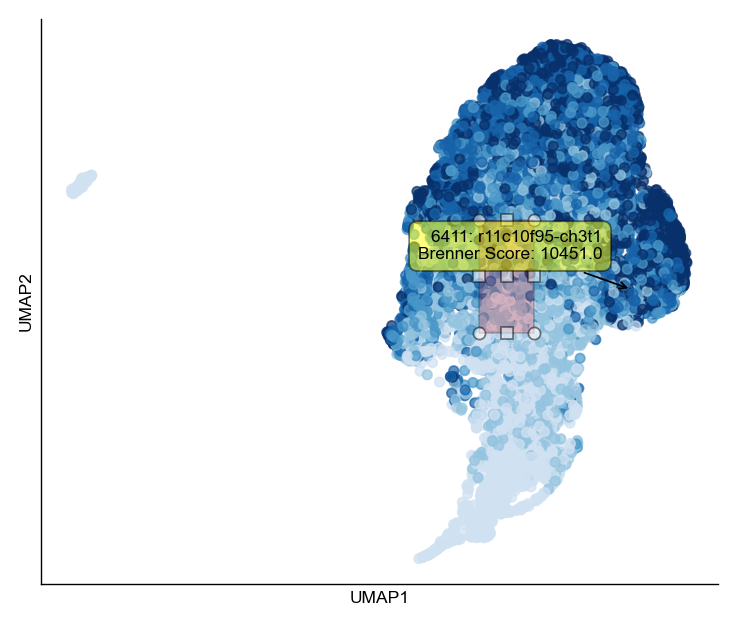

In [57]:
## change to ineractive
selected_indices_global = plot_umap_embeddings(
    umap_embeddings, label_data,
    config_data, 
    config_plot,
    df, RECOLOR_BY_BRENNER = True, dilute = 1, bins=5)

In [59]:
max_img = 10

Cropping image to fit


4 959.0


<IPython.core.display.Javascript object>


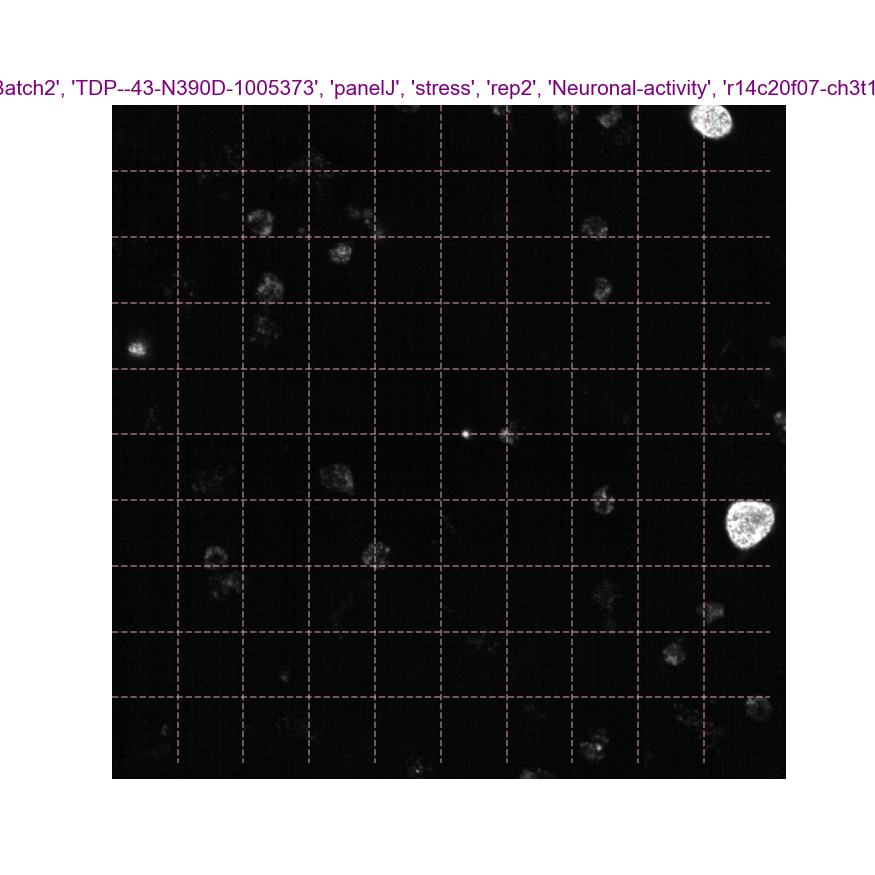

Img shape: (1024, 1024)
19 1976.0


Cropping image to fit


<IPython.core.display.Javascript object>


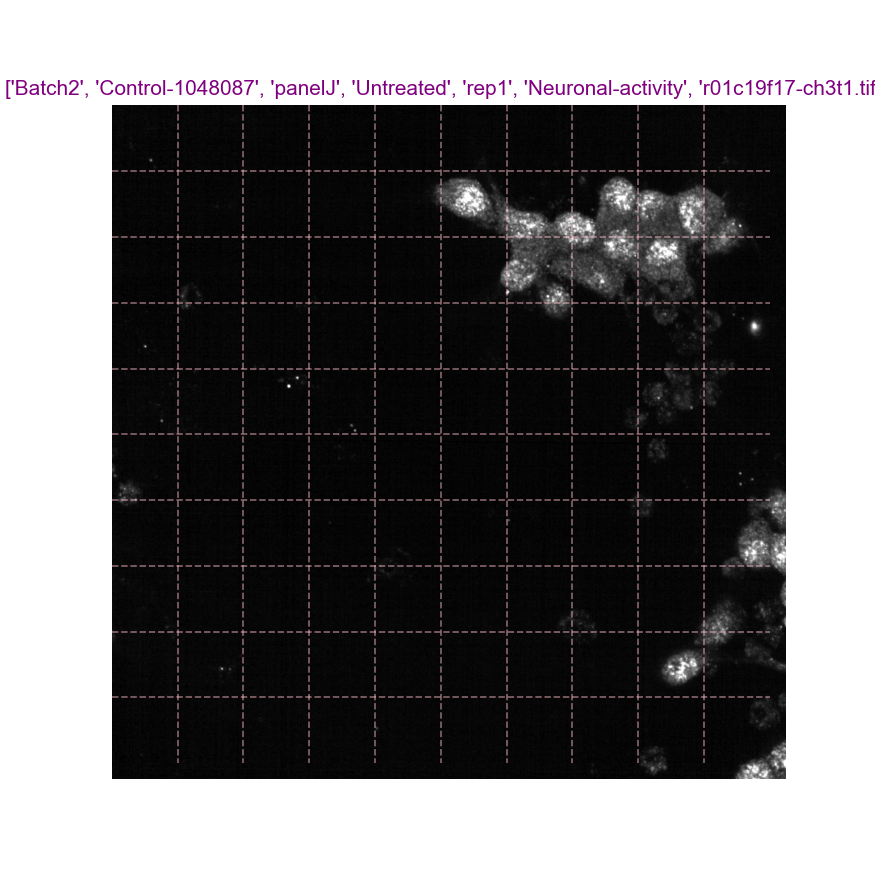

Img shape: (1024, 1024)
68 1515.0


Cropping image to fit


<IPython.core.display.Javascript object>


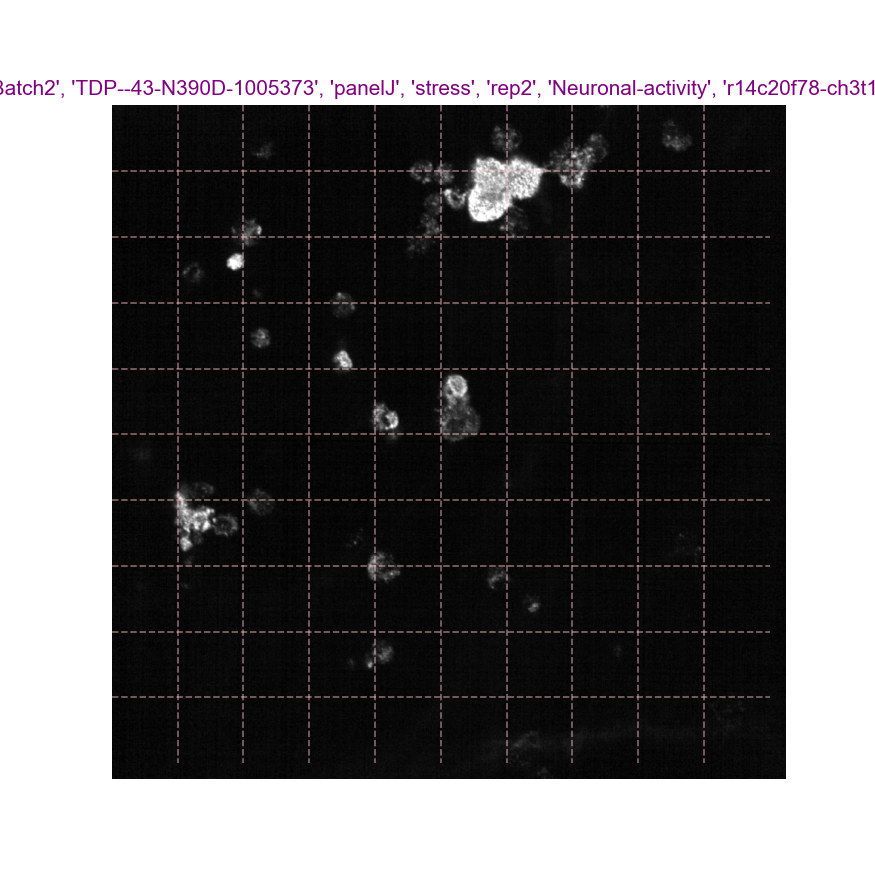

Img shape: (1024, 1024)
74 890.0


Cropping image to fit


<IPython.core.display.Javascript object>


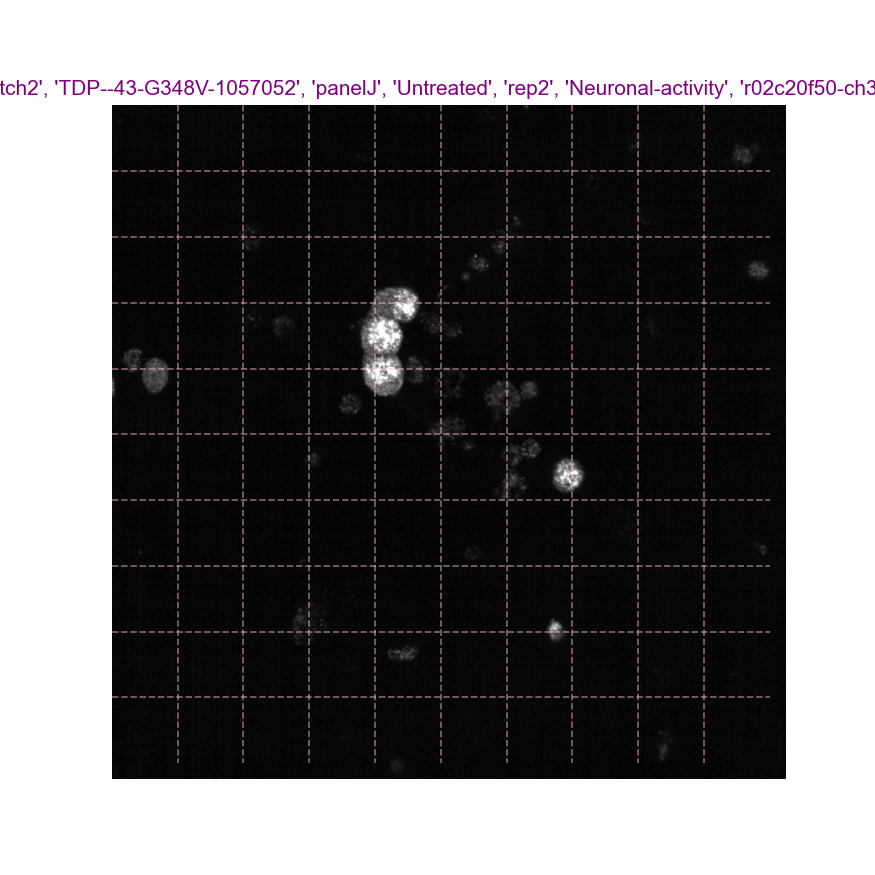

Img shape: (1024, 1024)
85 1902.0


Cropping image to fit


<IPython.core.display.Javascript object>


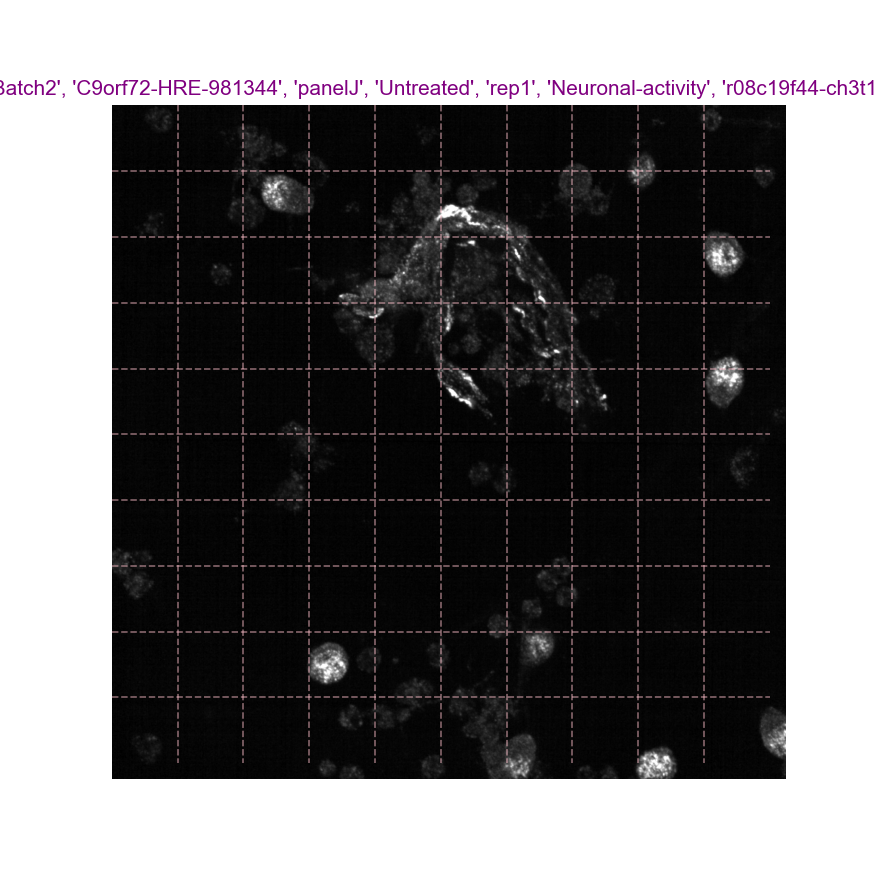

Img shape: (1024, 1024)
87 1902.0


Cropping image to fit


<IPython.core.display.Javascript object>


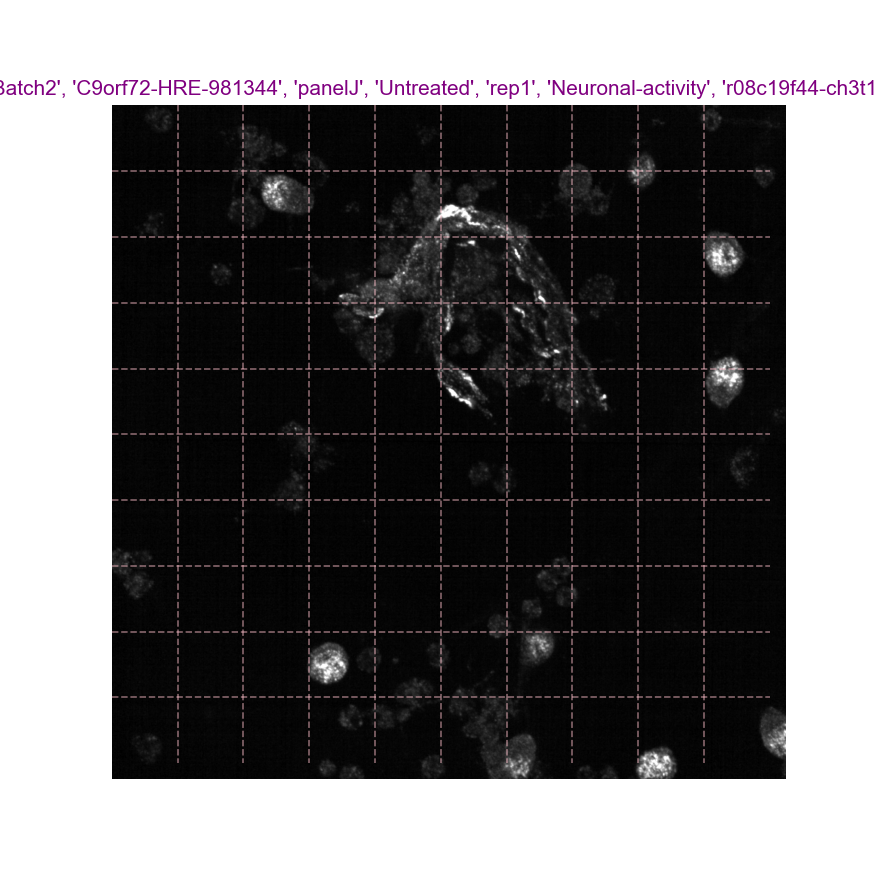

Img shape: (1024, 1024)
149 5271.0


Cropping image to fit


<IPython.core.display.Javascript object>


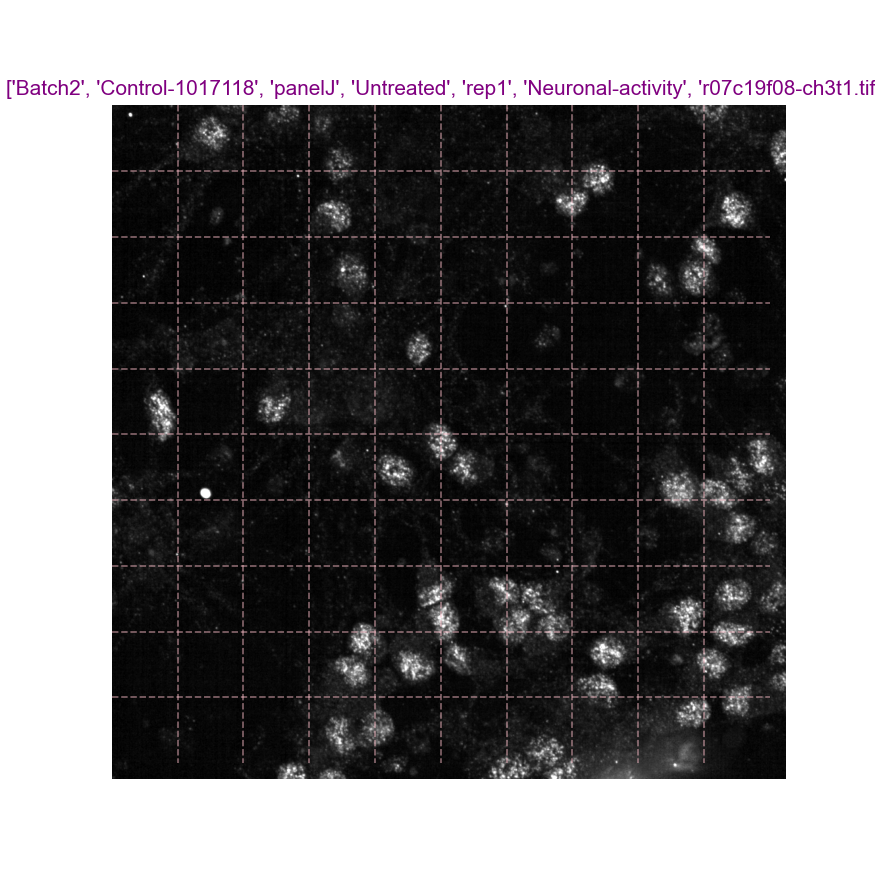

Img shape: (1024, 1024)
159 1479.0


Cropping image to fit
/home/labs/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/show_images_utils.py:107: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(7,7))


<IPython.core.display.Javascript object>


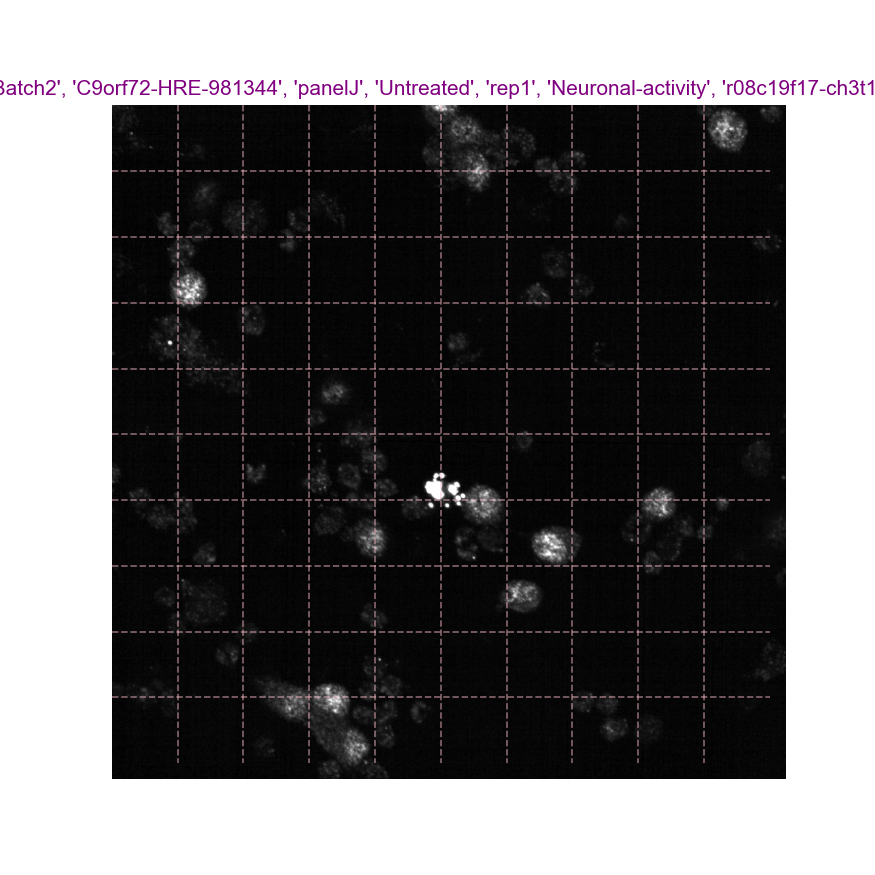

Img shape: (1024, 1024)
161 1479.0


Cropping image to fit


<IPython.core.display.Javascript object>


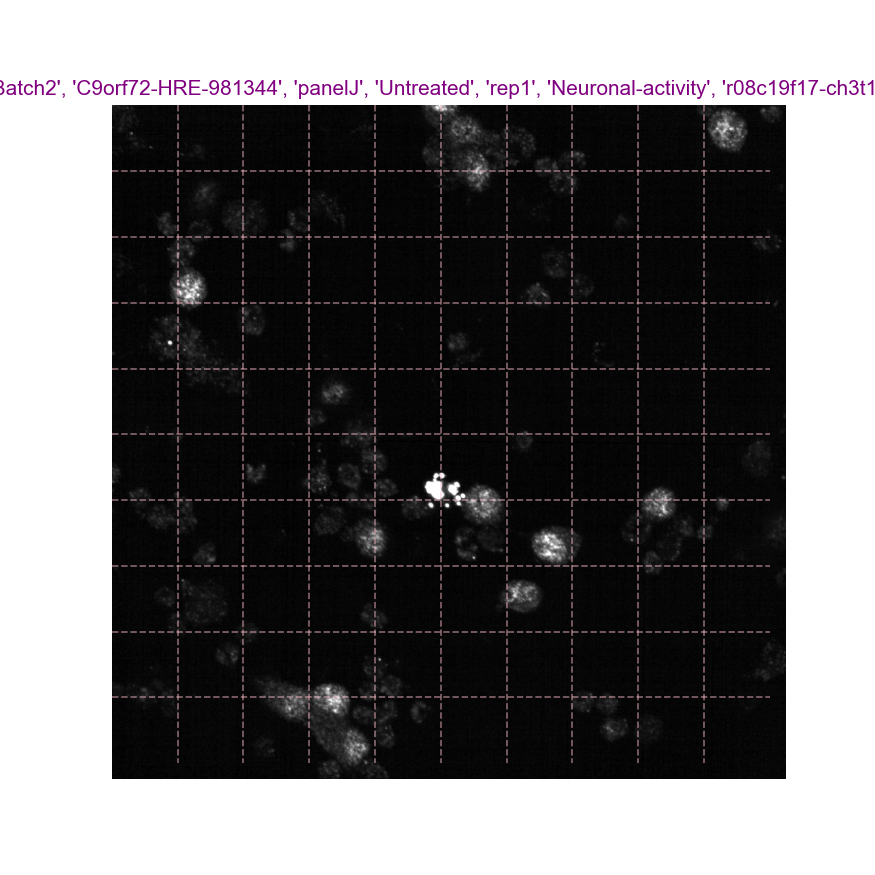

Img shape: (1024, 1024)
172 1479.0


Cropping image to fit


<IPython.core.display.Javascript object>


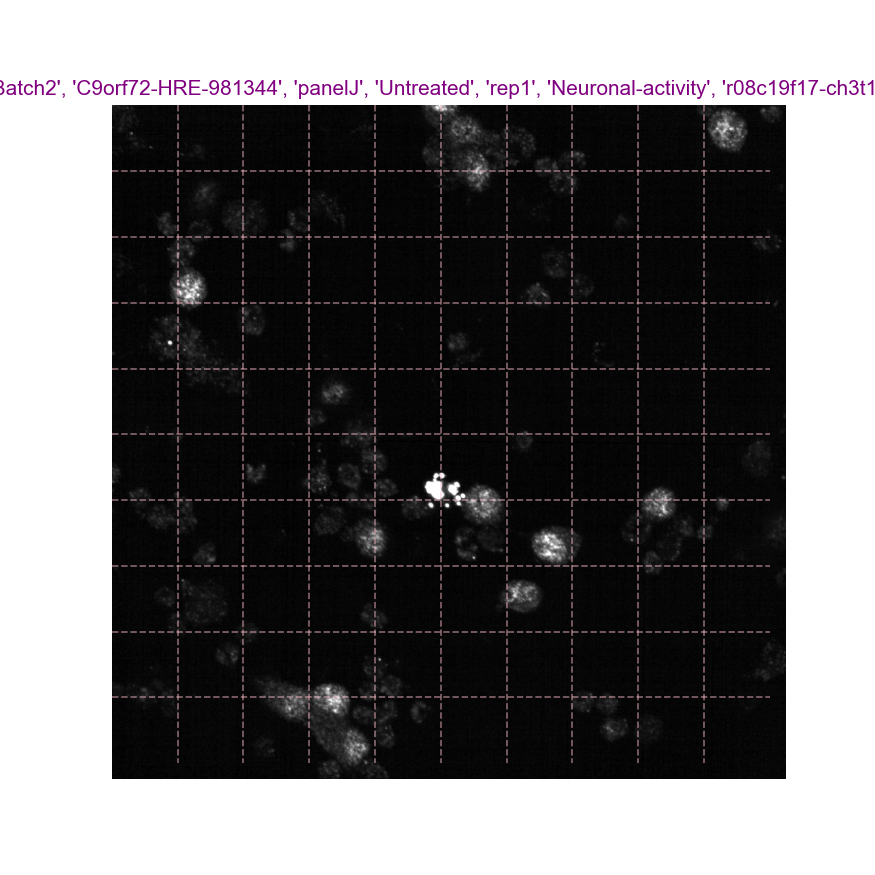

Img shape: (1024, 1024)


In [81]:
for ind in selected_indices_global[:max_img]:
    print(ind, df.iloc[ind]['Target_Sharpness_Brenner'])
    target_path = construct_target_path(df, ind, df_meta)
    show_processed_tif(target_path,)# mark_tile={'tile_index':int(df.Tile.iloc[ind]), 'img_shape':[1024, 1024] , 'tile_shape':[100,100] })
    plt.show()

24 /home/labs/hornsteinlab/Collaboration/FUNOVA/input/images/processed/Batch4/Control-1025045/Untreated/Aberrant-splicing/rep2_r03c10f100-ch3t1_panelE_Control-1025045_processed.npy


<IPython.core.display.Javascript object>


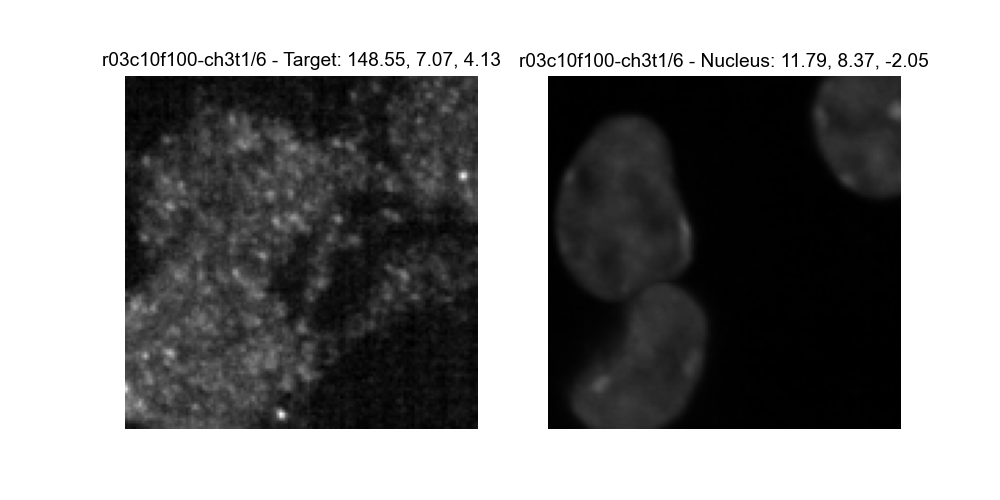

0.0 0.980225988700565
0.0 1.0
32 /home/labs/hornsteinlab/Collaboration/FUNOVA/input/images/processed/Batch4/Control-1025045/stress/Aberrant-splicing/rep1_r11c09f57-ch3t1_panelE_Control-1025045_processed.npy


<IPython.core.display.Javascript object>


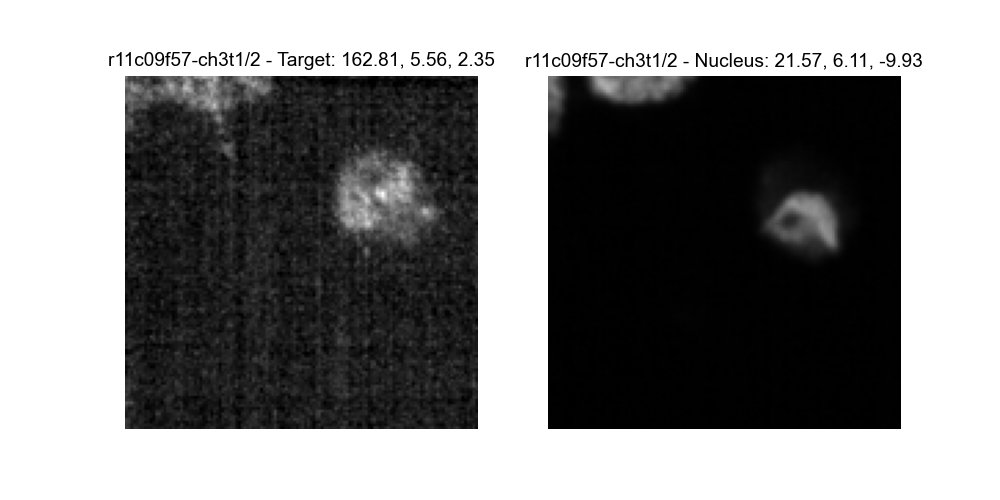

0.0 0.70995670995671
0.0 1.0
38 /home/labs/hornsteinlab/Collaboration/FUNOVA/input/images/processed/Batch4/C9orf72-HRE-981344/Untreated/Aberrant-splicing/rep2_r08c10f31-ch3t1_panelE_C9orf72-HRE-981344_processed.npy


<IPython.core.display.Javascript object>


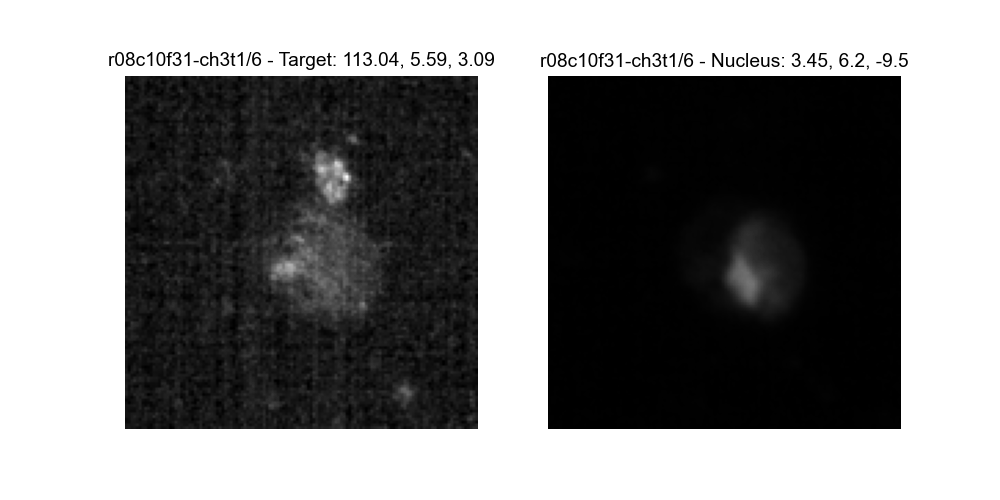

0.0 0.7279151943462897
0.0 1.0
40 /home/labs/hornsteinlab/Collaboration/FUNOVA/input/images/processed/Batch4/C9orf72-HRE-981344/Untreated/Aberrant-splicing/rep2_r08c10f31-ch3t1_panelE_C9orf72-HRE-981344_processed.npy


<IPython.core.display.Javascript object>


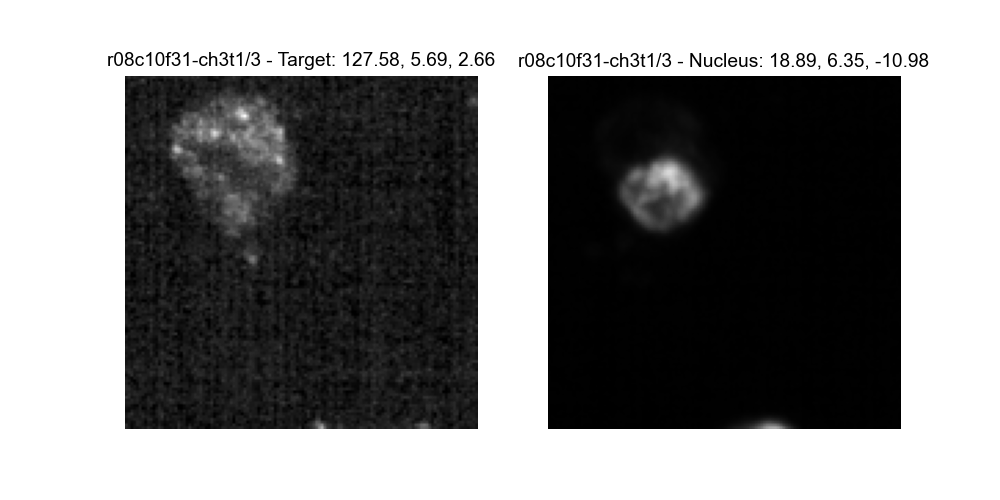

0.0 0.7420494699646644
0.0 1.0
41 /home/labs/hornsteinlab/Collaboration/FUNOVA/input/images/processed/Batch4/Control-1025045/Untreated/Aberrant-splicing/rep2_r03c10f100-ch3t1_panelE_Control-1025045_processed.npy


<IPython.core.display.Javascript object>


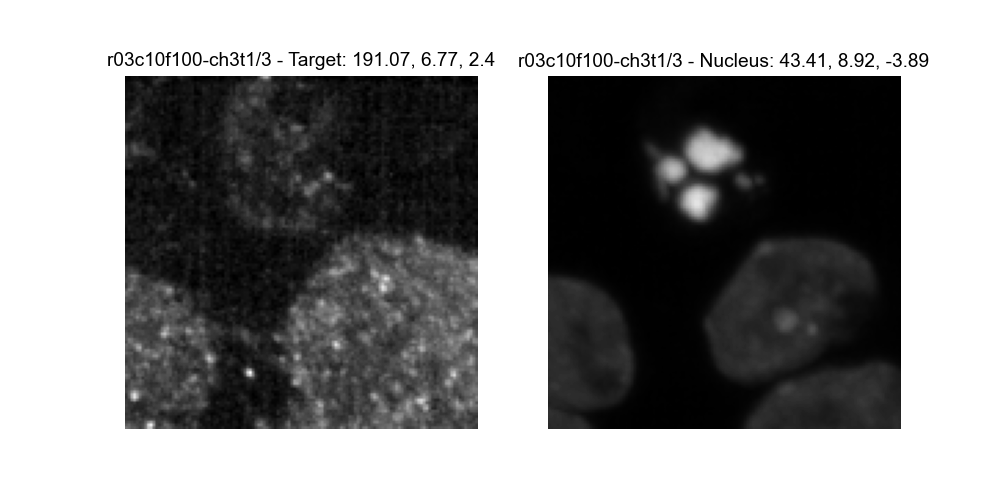

0.0 0.7146892655367232
0.0 1.0
43 /home/labs/hornsteinlab/Collaboration/FUNOVA/input/images/processed/Batch4/C9orf72-HRE-981344/Untreated/Aberrant-splicing/rep2_r08c10f31-ch3t1_panelE_C9orf72-HRE-981344_processed.npy


<IPython.core.display.Javascript object>


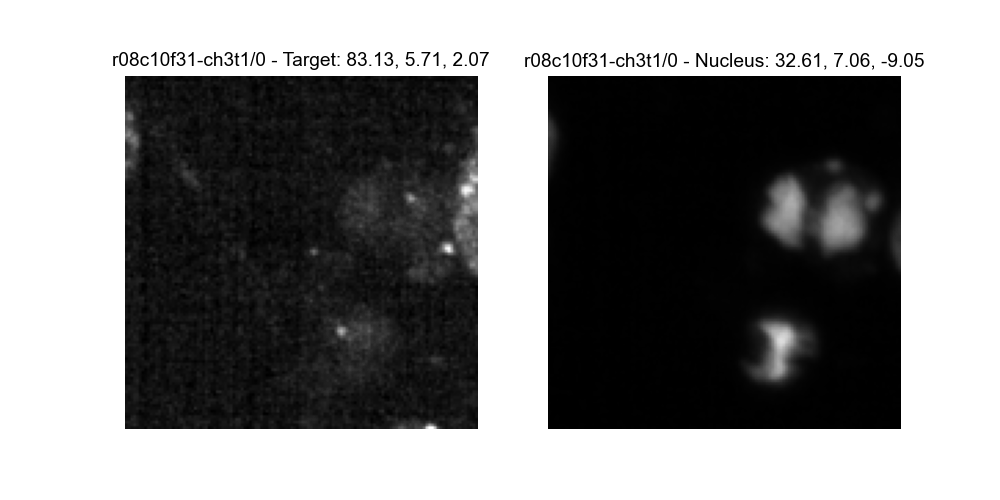

0.0 1.0
0.0 1.0
47 /home/labs/hornsteinlab/Collaboration/FUNOVA/input/images/processed/Batch4/C9orf72-HRE-981344/Untreated/Aberrant-splicing/rep2_r08c10f31-ch3t1_panelE_C9orf72-HRE-981344_processed.npy


<IPython.core.display.Javascript object>


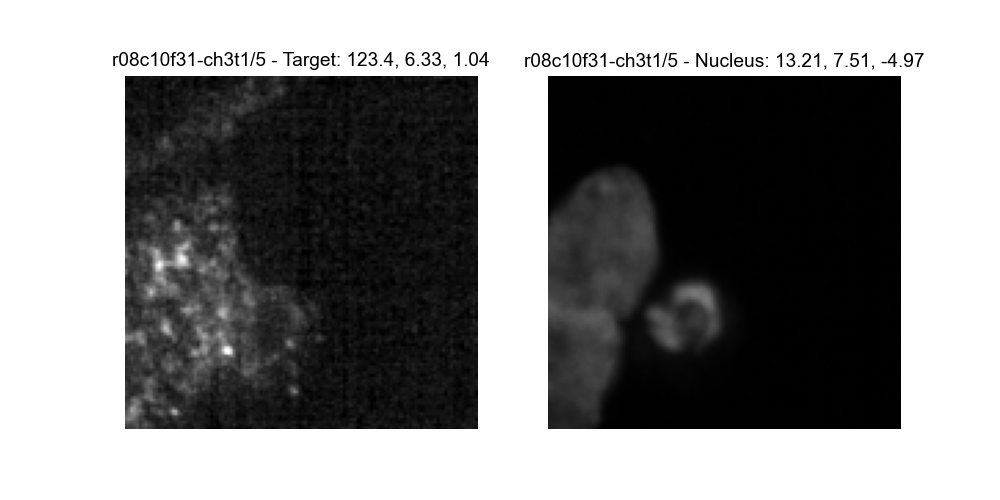

0.0 1.0
0.0 1.0
48 /home/labs/hornsteinlab/Collaboration/FUNOVA/input/images/processed/Batch4/Control-1025045/Untreated/Aberrant-splicing/rep2_r03c10f100-ch3t1_panelE_Control-1025045_processed.npy


<IPython.core.display.Javascript object>


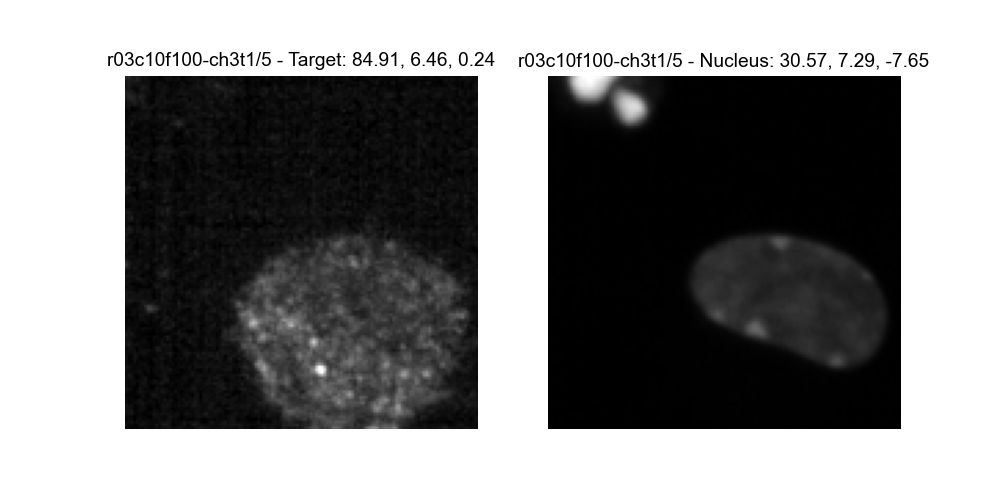

0.0 1.0
0.0 1.0
73 /home/labs/hornsteinlab/Collaboration/FUNOVA/input/images/processed/Batch4/Control-1025045/Untreated/Aberrant-splicing/rep2_r03c10f29-ch3t1_panelE_Control-1025045_processed.npy


<IPython.core.display.Javascript object>


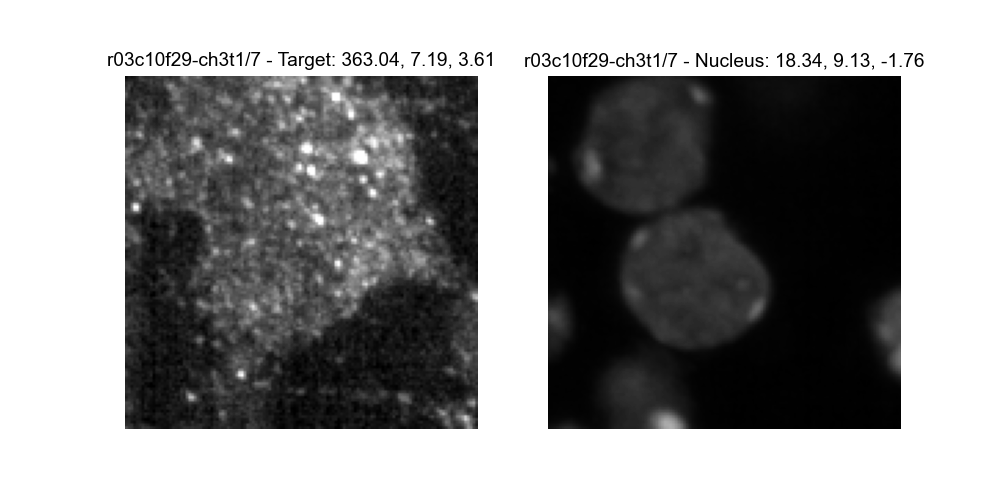

0.0 1.0
0.0 1.0
131 /home/labs/hornsteinlab/Collaboration/FUNOVA/input/images/processed/Batch4/TDP--43-N390D-1005373/Untreated/Aberrant-splicing/rep2_r06c10f82-ch3t1_panelE_TDP--43-N390D-1005373_processed.npy


<IPython.core.display.Javascript object>


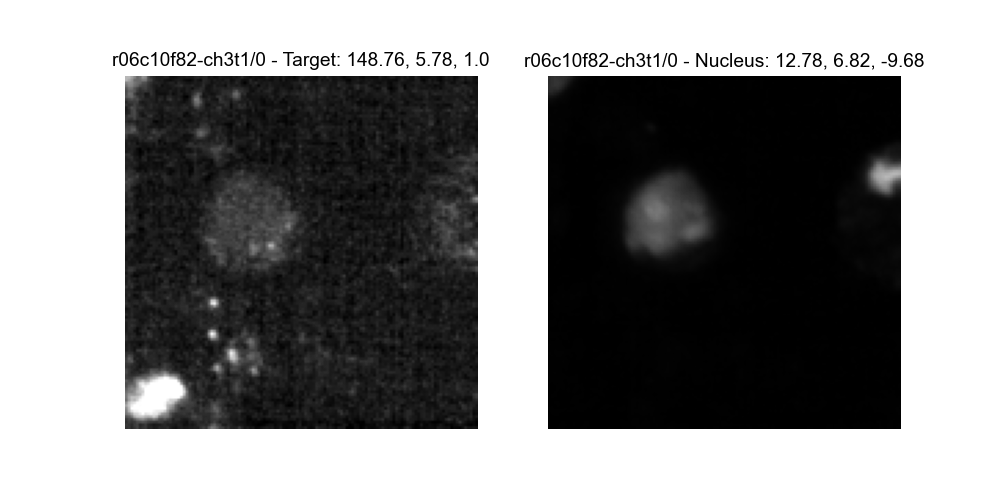

0.0 1.0
0.0 1.0


In [60]:
for ind in selected_indices_global[:max_img]:
    print(ind, df.Path.iloc[ind])
    r = show_processed_tile(df, ind)
    plt.show()

In [43]:
df.loc[(df.Image_Name == 'r07c09f02-ch3t1')&(df.Tile == '2')].Path.values

array(['/home/labs/hornsteinlab/Collaboration/FUNOVA/input/images/processed/Batch4/Control-1017118/Untreated/Aberrant-splicing/rep1_r07c09f02-ch3t1_panelE_Control-1017118_processed.npy'],
      dtype=object)

In [46]:
image = np.load('/home/labs/hornsteinlab/Collaboration/FUNOVA/input/images/processed_before_brenner_on_tiles/Batch4/Control-1017118/Untreated/Aberrant-splicing/rep1_r07c09f02-ch3t1_panelE_Control-1017118_processed.npy')

In [48]:
site_image = image[2] 

<IPython.core.display.Javascript object>


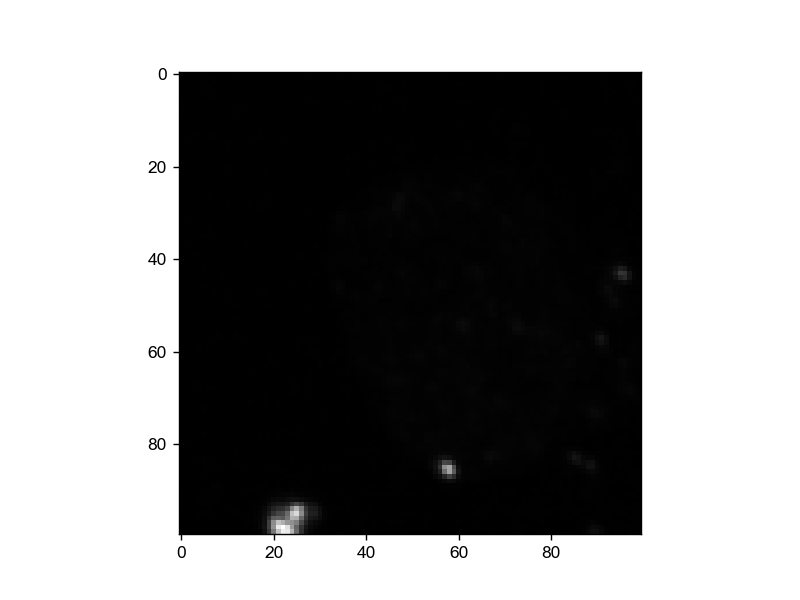

In [52]:
plt.figure()
plt.imshow(site_image[:, :, 0], cmap='gray', vmin=0, vmax=1)
plt.show()

In [51]:
site_image[:, :, 0] = (site_image[:, :, 0] - np.min(site_image[:, :, 0]))/ (np.max(site_image[:, :, 0])- np.min(site_image[:, :, 0]))


In [37]:
show_processed_tile(df, 1286)

IndexError: index 2 is out of bounds for axis 0 with size 0

batch Batch3 panel J
275


<IPython.core.display.Javascript object>


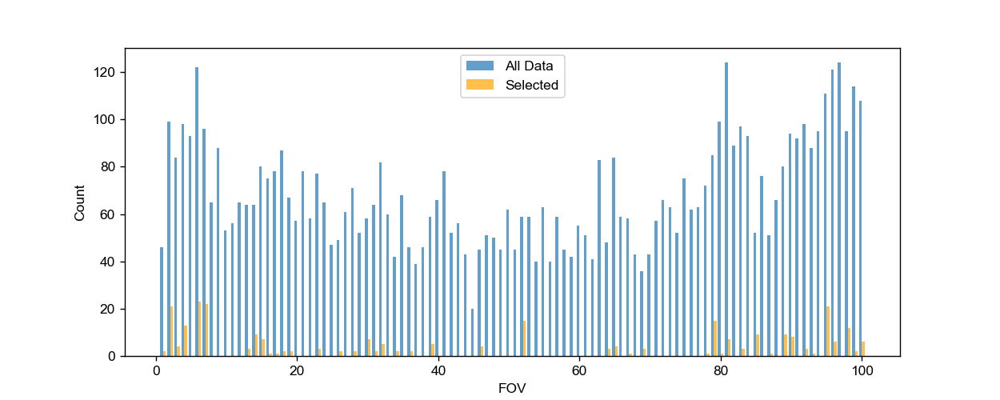

<IPython.core.display.Javascript object>


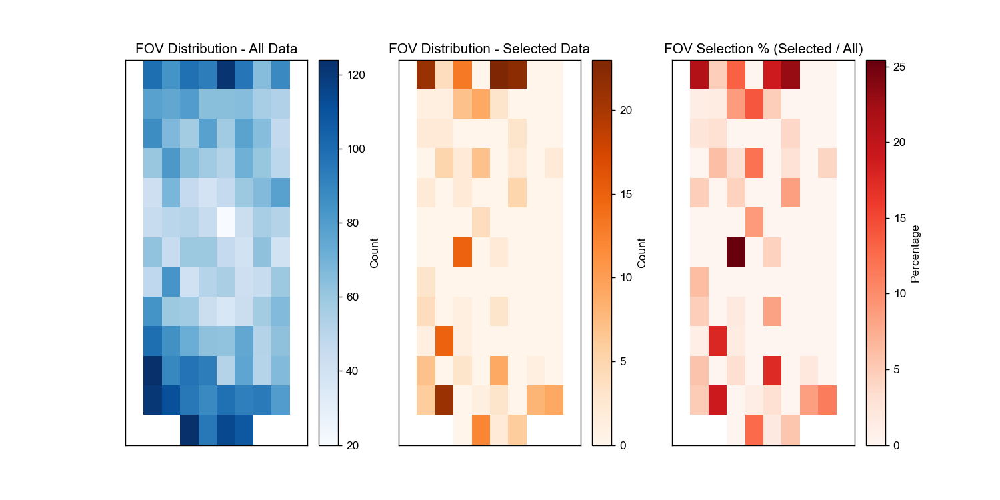

In [64]:
## Add FOV in well 
# --- Determine FOV Layout Based on Batch and Panel ---
batch = df["Batch"].iloc[0]  # Assuming uniform batch
panel = df["Panel"].iloc[0].split('panel')[1]  # Assuming uniform panel

if batch not in fov_layouts:
    raise ValueError(f"Unknown Batch: {batch}")
if panel not in fov_layouts[batch]:
    raise ValueError(f"Unknown Panel: {panel}")
print('batch', batch, 'panel', panel)
print(len(selected_indices_global))

fov_grid = fov_layouts[batch][panel]

plot_fov_histogram(df, selected_indices_global)
plot_fov_heatmaps(df, selected_indices_global, fov_grid)

In [67]:
np.percentile(df.loc[selected_indices_global]['Target_Sharpness_Brenner'], 50)

8153.0

In [432]:
# pd.concat([df[col][selected_indices_global].value_counts().rename(col) for col in ["Batch", "Rep", "Cell_Line", "Tile"]], axis=1)

In [433]:
# df.loc[selected_indices_global].query("Condition == 'Untreated' & Cell_Line == 'Control-1001733'").Path.iloc[0]

In [336]:
df.loc[selected_indices_global][["Sum_Channel_0", "Sum_Channel_1"]].mean()

Sum_Channel_0     93.717112
Sum_Channel_1    291.014911
dtype: float64

In [349]:
df[["Sum_Channel_0", "Sum_Channel_1"]].mean()

Sum_Channel_0    443.630318
Sum_Channel_1    577.370777
dtype: float64

In [344]:
df["Sum_Channel_0"].values

array([862.95087708, 312.89343219, 278.0625661 , ..., 937.63953061,
        64.44001395, 171.5421318 ])

In [180]:
# # Global storage for selected indices (needed for external access)
# selected_indices_global = []
# rect_selector = None  # Persistent RectangleSelector
# def plot_umap_embeddings(
#     umap_embeddings: np.ndarray,
#     label_data: np.ndarray,
#     config_data,
#     config_plot,
#     df_data=None,
#     title: str = None,
#     dpi: int = 500,
#     figsize: tuple = (6, 5),
#     cmap: str = 'tab20',
#     ari_score: float = None,
#     RECOLOR_BY_BRENNER=True,
#     dilute: int = 1, bins: int = 10
# ):
#     """Plots UMAP embeddings with interactive hovering for labels, with optional data dilution."""
#     global rect_selector, selected_indices_global  # Keep selector alive
#     if umap_embeddings.shape[0] != label_data.shape[0]:
#         raise ValueError("The number of embeddings and labels must match.")
    
#     # Apply dilution
#     umap_embeddings = umap_embeddings[::dilute]
#     label_data = label_data[::dilute]
#     df = df_data.copy().iloc[::dilute].reset_index() if df_data is not None else None

#     annotations_dict = {}; colors_dict = {}; scatter_mappings = {}

#     if df is not None:
#         image_names_dict = {idx: row.Image_Name for idx, row in df.iterrows()}
#         if "Target_Sharpness_Brenner" in df.columns:
#             brenner_scores_dict = {idx: row.Target_Sharpness_Brenner for idx, row in df.iterrows()}
#             annotations_dict = {
#                 idx: f"{idx}: {image_names_dict.get(idx, 'Unknown')}\nBrenner Score: {brenner_scores_dict.get(idx, 'N/A')}"
#                 for idx in df.index
#             }
#             if RECOLOR_BY_BRENNER:
#                 df["Color"] = set_colors_by_brenners(df["Target_Sharpness_Brenner"].fillna(0), bins=bins)
#                 colors_dict = {idx: row.Color for idx, row in df.iterrows()}
#         else:
#             annotations_dict = {idx: f"{idx}: {image_names_dict.get(idx, 'Unknown')}" for idx in df.index}
    
#     name_color_dict = config_plot['COLOR_MAPPINGS']
#     name_key, color_key = config_plot['MAPPINGS_ALIAS_KEY'], config_plot['MAPPINGS_COLOR_KEY']
#     marker_size, alpha = config_plot['SIZE'], config_plot['ALPHA']
#     cmap = plt.get_cmap(cmap)
#     unique_groups = np.unique(label_data)
    
#     fig, ax = plt.subplots(figsize=figsize)
#     scatter_objects = []
#     legend_labels = []
#     for group in unique_groups:
#         group_indices = np.where(label_data == group)[0]
#         if RECOLOR_BY_BRENNER and df is not None and "Target_Sharpness_Brenner" in df.columns:
#             rgba_colors = [colors_dict.get(idx, "#000000") for idx in group_indices]
#         else:
#             base_color = name_color_dict[group][color_key]
#             rgba_colors = [mcolors.to_rgba(base_color, alpha=alpha)] * len(group_indices)
        
#         scatter = ax.scatter(
#             umap_embeddings[group_indices, 0],
#             umap_embeddings[group_indices, 1],
#             s=marker_size,
#             alpha=alpha,
#             c=rgba_colors,
#             marker='o',
#         )
#         scatter_objects.append(scatter)
#         legend_labels.append(name_color_dict[group][name_key])
#         scatter_mappings[scatter] = group_indices.tolist()
    
#     # Add legend
#     ax.legend(scatter_objects, legend_labels, loc="upper right", title="Groups")
    
#     # Enable interactive hovering with precomputed labels
#     cursor = mplcursors.cursor(scatter_objects, hover=True)
    
#     @cursor.connect("add")
#     def on_hover(sel):
#         scatter_obj = sel.artist
#         scatter_index = sel.index
        
#         if scatter_obj in scatter_mappings:
#             actual_index = scatter_mappings[scatter_obj][scatter_index]  # Correct mapping
#             sel.annotation.set_text(annotations_dict.get(actual_index, "Unknown"))
#         else:
#             sel.annotation.set_text("Unknown")
            
#     # **Rectangle Selection Functionality**
#     def on_select(eclick, erelease):
#         """Handles rectangle selection and stores selected point indices."""
#         global selected_indices_global

#         if eclick.xdata is None or erelease.xdata is None:
#             return  # Ignore invalid selections

#         x_min, x_max = sorted([eclick.xdata, erelease.xdata])
#         y_min, y_max = sorted([eclick.ydata, erelease.ydata])

#         selected_indices_global = [
#             i for i in range(len(umap_embeddings))
#             if x_min <= umap_embeddings[i, 0] <= x_max and y_min <= umap_embeddings[i, 1] <= y_max
#         ]

#         print("Selected Indices:", selected_indices_global)  # Output in Jupyter Notebook

#     # Attach Rectangle Selector (global storage prevents garbage collection)
#     rect_selector = RectangleSelector(ax, on_select, interactive=True, useblit=False)
    
#     ax.set_title(title if title else "UMAP Projection")
#     __format_UMAP_legend(ax, marker_size)
#     __format_UMAP_axes(ax, title)
#     fig.tight_layout()
#     plt.show()
#     return

In [16]:
# import matplotlib.pyplot as plt
# import mplcursors
# import numpy as np
# from matplotlib.widgets import RectangleSelector

# # Sample data
# x = np.arange(10)
# y = np.arange(10)
# label_data = [1, 1, 1, 1, 1, 2, 2, 2, 2, 2]

# # Create figure
# fig, ax = plt.subplots()

# # Scatter plot
# sc = ax.scatter(x, y, c=label_data, cmap="tab20", edgecolors="black")

# # Enable interactive cursor
# cursor = mplcursors.cursor(sc, hover=True)

# @cursor.connect("add")
# def on_hover(sel):
#     sel.annotation.set_text(label_data[sel.index])

# # Store selected indices
# selected_indices_global = []
# # Function to check if a point is inside the rectangle
# def on_select(eclick, erelease):
#     global selected_indices_global
#     if eclick.xdata is None or erelease.xdata is None:
#         return  # Ignore invalid selections
#     x_min, x_max = sorted([eclick.xdata, erelease.xdata])
#     y_min, y_max = sorted([eclick.ydata, erelease.ydata])
#     selected_indices_global = [i for i in range(len(x)) if x_min <= x[i] <= x_max and y_min <= y[i] <= y_max]

# # Create rectangle selector
# rect_selector = RectangleSelector(ax, on_select, useblit=True, interactive=True)

# plt.show()

In [29]:
selected_indices_global

[6]

In [ ]:
# import pickle
# import matplotlib.pyplot as plt
# import mplcursors
# import numpy as np

# x = np.arange(10)
# y = np.arange(10)
# label_data = [1,1,1,1,1,2,2,2,2,2]

# # Create figure
# %matplotlib notebook
# fig, ax = plt.subplots()

# # Scatter plot
# sc = ax.scatter(x, y, cmap="tab20")

# # Enable interactive cursor
# cursor = mplcursors.cursor(sc, hover=True)

# @cursor.connect("add")
# def on_hover(sel):
#     sel.annotation.set_text(label_data[sel.index])

# plt.show()

In [ ]:
# def plot_umap_embeddings(
#     umap_embeddings: np.ndarray,
#     label_data: np.ndarray,
#     config_data,
#     config_plot,
#     df=None,
#     title: str = None,
#     dpi: int = 500,
#     figsize: tuple = (6, 5),
#     cmap: str = 'tab20',
#     ari_score: float = None,
#     RECOLOR_BY_BRENNER=True
# ):
#     """Plots UMAP embeddings with interactive hovering for labels."""
    
#     if umap_embeddings.shape[0] != label_data.shape[0]:
#         raise ValueError("The number of embeddings and labels must match.")

#     colors, brenner_scores, image_names, annotations_dict = None, None, None, {}
#     if df is not None:
#         image_names_dict = { idx: row.Image_Name for idx, row in df.iterrows() }
#         if "Target_Sharpness_Brenner" in df.columns:
#             brenner_scores_dict = { idx: row.Target_Sharpness_Brenner for idx, row in df.iterrows() }
#             annotations_dict = { idx: f"{image_names_dict.get(idx, 'Unknown')}\nBrenner Score: {brenner_scores_dict.get(idx, 'N/A')}" for idx in df.index }
#         else:
#             annotations_dict = { idx: f"{image_names_dict.get(idx, 'Unknown')}" for idx in df.index }
#         if RECOLOR_BY_BRENNER:
#             sharpness_values = df["Target_Sharpness_Brenner"].fillna(0)
#             df["Color"] = set_colors_by_brenners(sharpness_values)
#             colors_dict = { idx: row.Color for idx, row in df.iterrows() }
    
#     name_color_dict = config_plot.COLOR_MAPPINGS
#     name_key, color_key = config_plot.MAPPINGS_ALIAS_KEY, config_plot.MAPPINGS_COLOR_KEY
#     marker_size, alpha = config_plot.SIZE, config_plot.ALPHA
#     cmap = plt.get_cmap(cmap)
#     unique_groups = np.unique(label_data)
    
#     fig = plt.figure(figsize=figsize)
#     gs = GridSpec(2, 1, height_ratios=[20, 1])
#     ax = fig.add_subplot(gs[0])
    
#     scatter_objects = []; legend_labels = []
#     for i, group in enumerate(unique_groups):
#         group_indices = np.where(label_data == group)[0]
#         if RECOLOR_BY_BRENNER and df is not None:
#             rgba_colors = [colors_dict.get(idx, "#000000") for idx in group_indices]
#         else:
#             base_color = name_color_dict[group][color_key]
#             rgba_colors = [mcolors.to_rgba(base_color, alpha=alpha)] * len(group_indices)
        
#         scatter = ax.scatter(
#             umap_embeddings[group_indices, 0],
#             umap_embeddings[group_indices, 1],
#             s=marker_size,
#             alpha=alpha,
#             c=rgba_colors,
#             marker='o',
#         )
#         scatter_objects.append(scatter)
#         legend_labels.append(name_color_dict[group][name_key])
    
#     ax.legend(scatter_objects, legend_labels, loc="upper right", title="Groups")
#     # Enable interactive hovering with precomputed labels
#     cursor = mplcursors.cursor(scatter_objects, hover=True)
    
#     @cursor.connect("add")
#     def on_hover(sel):
#         index = sel.index
#         sel.annotation.set_text(annotations_dict.get(index, "Unknown"))
    
#     __format_UMAP_axes(ax, title)
#     __format_UMAP_legend(ax, marker_size)
#     fig.tight_layout()
#     plt.show()
#     return

In [5]:
# # Load data
# with open(umaps_dir + path_to_umap, "rb") as f:
#     data = pickle.load(f)
# umap_embeddings = data["umap_embeddings"]
# label_data = data["label_data"]
# paths = data['paths']

# config_data = data["config_data"]
# config_plot = data["config_plot"]
# # Regex pattern to extract Batch, Rep, Raw Image Name, Panel, and Cell Line
# pattern = re.compile(r".*/(Batch\d+)/.*/(rep\d+)_(r\d+c\d+f\d+-ch\d+t\d+)_(panel\w+)_(.+)_processed\.npy")

# # Parsing the paths
# parsed_data = [pattern.match(path).groups() for path in paths if pattern.match(path)]

# # Convert to DataFrame
# df = pd.DataFrame(parsed_data, columns=["Batch", "Rep", "Image_Name", "Panel", "Cell_Line"])
# # Merge df_temp with df to get Target_Sharpness_Brenner
# df = df.merge(dfb[["Batch", "Image_Name", "Target_Sharpness_Brenner"]], 
#                         on=["Batch", "Image_Name"], 
#                         how="left")
# df["Target_Sharpness_Brenner"] = df["Target_Sharpness_Brenner"].round()

In [8]:
# def set_colors_by_brenners(sharpness_values):
#     # Compute percentile bins (10% intervals)
#     percentiles = np.percentile(sharpness_values, np.arange(0, 101, 10))

#     # Assign colors based on which percentile bin each value falls into
#     def get_blue_shade(value):
#         bin_idx = np.digitize(value, percentiles) - 1  # Get bin index
#         bin_idx = min(bin_idx, 9)  # Ensure max bin is 9
#         return mcolors.to_rgba(f"C{bin_idx}", alpha=0.8)  # Shades of blue

#     return [get_blue_shade(val) for val in sharpness_values]

# def plot_umap_embeddings(
#     umap_embeddings: np.ndarray, 
#     label_data: np.ndarray, 
#     config_data, 
#     config_plot, 
#     image_names, batches,
#     title: str = None, 
#     dpi: int = 500, 
#     figsize: tuple = (6,5),
#     cmap: str = 'tab20',
#     ari_score: float = None,
#     RECOLOR_BY_BRENNER = True, df = None
# ):
#     """Plots UMAP embeddings with interactive hovering for labels."""
    
#     if umap_embeddings.shape[0] != label_data.shape[0]:
#         raise ValueError("The number of embeddings and labels must match.")

#     colors = None
#     if RECOLOR_BY_BRENNER:
#         paths_df = pd.DataFrame({"Batch": batches, "Image_Name": image_names})
#         merged_df = paths_df.merge(df, on=["Batch", "Image_Name"], how="left")
#         sharpness_values = merged_df["Target_Sharpness_Brenner"].fillna(0)
#         colors = set_colors_by_brenners(sharpness_values)
#     else:
#         colors = [config_plot.COLOR_MAPPINGS[g][config_plot.MAPPINGS_COLOR_KEY] for g in label_data]
    
#     name_color_dict = config_plot.COLOR_MAPPINGS
#     name_key = config_plot.MAPPINGS_ALIAS_KEY
#     color_key = config_plot.MAPPINGS_COLOR_KEY
#     marker_size = config_plot.SIZE
#     alpha = config_plot.ALPHA
#     cmap = plt.get_cmap(cmap)

#     unique_groups = np.unique(label_data)
    
#     fig = plt.figure(figsize=figsize)
#     gs = GridSpec(2, 1, height_ratios=[20, 1])
#     ax = fig.add_subplot(gs[0])

#     for i, group in enumerate(unique_groups):
#         group_indices = np.where(label_data == group)[0]

#         base_color = name_color_dict[group][color_key] if name_color_dict else cmap(i)
#         rgba_color = mcolors.to_rgba(base_color, alpha=alpha)

#         ax.scatter(
#             umap_embeddings[group_indices, 0],
#             umap_embeddings[group_indices, 1],
#             s=marker_size,
#             alpha=alpha,
#             c=[rgba_color] * len(group_indices),
#             marker='o',
#             label=name_color_dict[group][name_key] if name_color_dict else group,
#             linewidths=0
#         )

#     # Enable interactive hovering
#     cursor = mplcursors.cursor(ax.collections, hover=True)
    
#     @cursor.connect("add")
#     def on_hover(sel):
#         sel.annotation.set_text(image_names[sel.index])

#     __format_UMAP_axes(ax, title)
#     __format_UMAP_legend(ax, marker_size)

#     fig.tight_layout()

#     plt.show()

#     return

In [5]:
# # Load data
# with open(umaps_dir + path_to_umap, "rb") as f:
#     data = pickle.load(f)
# umap_embeddings = data["umap_embeddings"]
# label_data = data["label_data"]
# paths = data['paths']
# # img_names = [re.search(r'([^/]+)_processed\.npy', p).group(1) for p in paths]
# config_data = data["config_data"]
# config_plot = data["config_plot"]
# # Regex pattern to extract required components
# # pattern = re.compile(r"^(rep\d+)_(r\d+c\d+f\d+)-ch\d+t\d+_(panel\w+)_(.+)$")
# # # Parsing the image names
# # parsed_data = [pattern.match(name).groups() for name in img_names]
# # # Convert to DataFrame
# # df_temp = pd.DataFrame(parsed_data, columns=["Rep", "Raw_Image", "Panel", "Cell_Line"])
# # Function to extract Batch and Image_Name
# # def extract_batch_image(path):
# #     batch_match = re.search(r'/Batch(\d+)/', path)
# #     image_match = re.search(r'/(rep\d+_[^/]+)_panel', path)

# #     batch = f"Batch{batch_match.group(1)}" if batch_match else None
# #     image_name = image_match.group(1) if image_match else None
    
# #     return batch, image_name

# # # Extract from all paths
# # batch_image_list = [extract_batch_image(p) for p in paths]
# # batches, image_names = zip(*batch_image_list)  # Split tuples into separate lists
